<div style="text-align: center;">
  <span style="font-size:x-large; font-weight: bold;">Dynamic Ensemble Models Research</span>
</div>

-------

<span style="font-size: large; font-weight: bold; text-decoration: underline;">Task 1: Implement the simple logistic regression model</span>

Importing necessary libraries

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

import warnings
warnings.filterwarnings("ignore")

In [297]:
# Loading the dataset into a pandas dataframe
df = pd.read_csv('/Users/sahilkakkar/Downloads/(1) Yeshiva/Numerical Methods/Final Project/allwine.csv')

In [290]:
df.head()

,Unnamed: 0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0,-0.743787,0.805266,-1.455948,-0.541531,-0.334525,-0.539436,-0.978159,0.146723,-0.755850,-1.297136,0
1,1,-0.520914,1.798500,-1.455948,-0.047918,0.129345,0.787432,-0.998211,-1.220838,-0.062351,-0.960761,0
2,2,-0.520914,1.136344,-1.251203,-0.259467,0.002835,-0.160331,-0.994200,-0.956148,-0.235726,-0.960761,0
3,3,1.373509,-1.512280,1.410480,-0.541531,-0.355610,0.029222,-0.974148,-1.397297,-0.640267,-0.960761,1
4,4,-0.743787,0.805266,-1.455948,-0.541531,-0.334525,-0.539436,-0.978159,0.146723,-0.755850,-1.297136,0


Dropping the unnecessary column named 'Unnamed: 0'

In [298]:
df.drop(['Unnamed: 0'], axis = 1, inplace = True)

In [10]:
# We have in total 3198 rows in this dataset
# We have 10 features (independent variable) and one dependent variable named 'quality'
df.shape

(3198, 11)

In [12]:
# We do not have NaN values in our dataset
df.isnull().sum()

fixed acidity          0
volatile acidity       0
citric acid            0
residual sugar         0
chlorides              0
free sulfur dioxide    0
density                0
pH                     0
sulphates              0
alcohol                0
quality                0
dtype: int64

In [7]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,density,pH,sulphates,alcohol,quality
count,3.198000e+03,3.198000e+03,3.198000e+03,3.198000e+03,3.198000e+03,3.198000e+03,3.198000e+03,3.198000e+03,3.198000e+03,3.198000e+03,3198.000000
mean,-3.732682e-16,-3.643809e-16,1.688594e-16,5.332403e-17,-1.777468e-16,-6.221137e-17,-1.848566e-15,2.132961e-16,-3.377189e-16,-3.554936e-17,0.534709
std,1.000156e+00,1.000156e+00,1.000156e+00,1.000156e+00,1.000156e+00,1.000156e+00,1.000156e+00,1.000156e+00,1.000156e+00,1.000156e+00,0.498872
min,-2.303900e+00,-2.395155e+00,-1.623825e+00,-1.246692e+00,-1.683967e+00,-1.487200e+00,-1.133162e+00,-3.250120e+00,-2.085055e+00,-2.138075e+00,0.000000
25%,-6.880688e-01,-7.413923e-01,-9.041204e-01,-4.710149e-01,-3.766953e-01,-7.930922e-01,-9.992135e-01,-7.796891e-01,-6.402666e-01,-7.137768e-01,0.000000
50%,-1.883037e-01,-3.776619e-02,-6.651164e-02,-2.594666e-01,-1.744349e-01,-2.140109e-01,-7.166201e-04,-2.683110e-03,-1.977143e-01,-1.262511e-01,1.000000
75%,5.638545e-01,6.221545e-01,7.962457e-01,6.705718e-02,8.597896e-02,5.481191e-01,9.990931e-01,7.564772e-01,4.338530e-01,6.383188e-01,1.000000
max,4.580738e+00,5.932391e+00,3.824068e+00,9.138676e+00,1.115258e+01,5.245422e+00,1.140202e+00,3.769595e+00,7.944553e+00,4.311531e+00,1.000000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3198 entries, 0 to 3197
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   fixed acidity        3198 non-null   float64
 1   volatile acidity     3198 non-null   float64
 2   citric acid          3198 non-null   float64
 3   residual sugar       3198 non-null   float64
 4   chlorides            3198 non-null   float64
 5   free sulfur dioxide  3198 non-null   float64
 6   density              3198 non-null   float64
 7   pH                   3198 non-null   float64
 8   sulphates            3198 non-null   float64
 9   alcohol              3198 non-null   float64
 10  quality              3198 non-null   int64  
dtypes: float64(10), int64(1)
memory usage: 275.0 KB


### Brief description of the attributes in this dataset
Each feature within the dataset imparts insights into distinct chemical attributes of the wines. Here's a concise overview of several features present in the wine dataset:

- **Fixed Acidity:** &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;Signifying the quantity of non-volatile acids in the wine.
- **Volatile Acidity:** &ensp;&ensp;&ensp;&ensp;&thinsp;&ensp;&ensp;&thinsp;&thinsp;Reflecting the presence of acetic acid, which can contribute to the wine's volatile characteristics.
- **Citric Acid:** &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;Denoting the amount of citric acid in the wine, adding freshness and flavor.
- **Residual Sugar:** &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;Measuring the remaining sugar content in the wine after fermentation concludes.
- **Chlorides:** &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; Representing the salt content in the wine.
- **Free Sulfur Dioxide:** The free form of SO2, existing in equilibrium between molecular SO2 (as a dissolved gas) and bisulfite ion.
- **Density:** &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&ensp;&ensp;Reflecting the density of the wine.
- **pH:** &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&ensp;Conveying the pH level of the wine, providing insights into its acidity or basicity.
- **Sulphates:** &emsp;&emsp;&emsp;&emsp;&emsp;&ensp;Expressing the quantity of sulfur dioxide added to the wine.
- **Alcohol:** &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&ensp;&ensp;Representing the alcohol content of the wine.
- **Quality:** &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;Indicating whether the quality of the wine is good or bad

-------

### Analysing and looking at each of the features to ensure that our data is clean and free of impurities

**Column: fixed acidity**

In [19]:
df['fixed acidity'].describe()

count    3.198000e+03
mean    -3.732682e-16
std      1.000156e+00
min     -2.303900e+00
25%     -6.880688e-01
50%     -1.883037e-01
75%      5.638545e-01
max      4.580738e+00
Name: fixed acidity, dtype: float64

Let's write a function to plot the boxplot and histogram together for these numerical variables

In [56]:
def plot_boxplot_and_histogram(column_name):
    # Setting the size of the whole figure
    plt.figure(figsize=(10, 6))

    # '12' value emphasizes that the plot would contain two subplots 
    # and they will be organised like a 1*2 matrix (i.e. a row with two plots)
    # '1' at the end of "12" indicates that this is the first plot and '2' indicates the second plot
    plt.subplot(121)

    # plotting a box plot with vertical orientation
    sns.boxplot(df[column_name], orient = 'v');

    # give the plot a title
    plt.title('Boxplot of {} variable'.format(column_name))

    # Putting empty string as the label for x-axis since it's not needed for box plot
    plt.xlabel(' ')

    # plotting the second plot in the 1*2 arrangement
    plt.subplot(122)

    # plotting a histogram with 20 bins
    sns.distplot(df[column_name], bins = 20)

    # give the plot a title
    plt.title('Histogram of {} variable'.format(column_name))

    plt.show();
    

**Plotting Box plots and histograms for all the numerical variables**

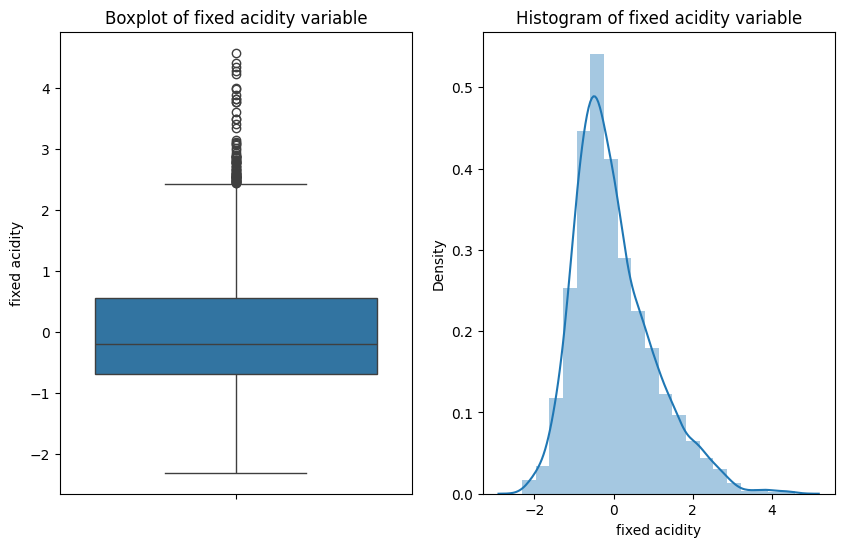

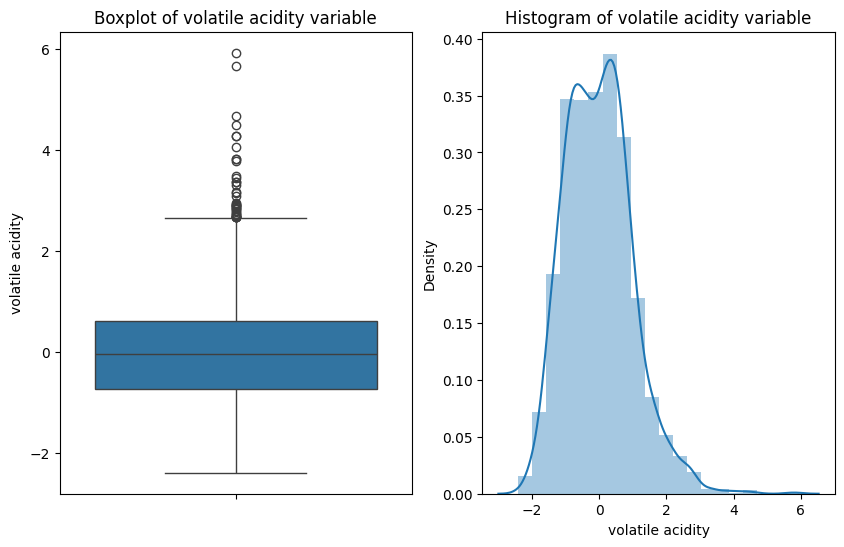

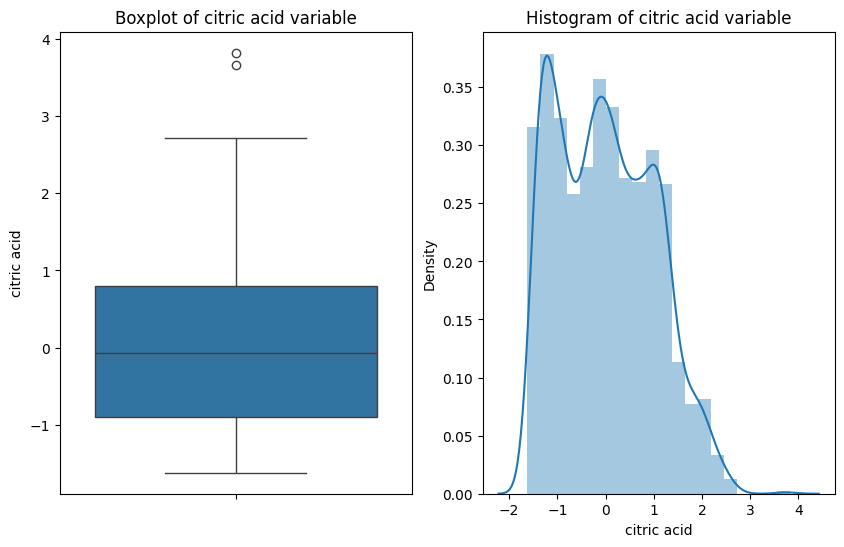

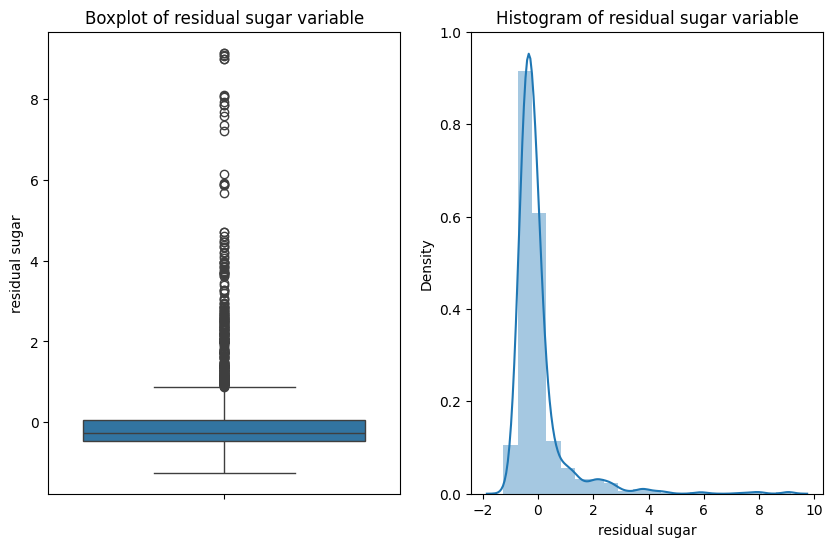

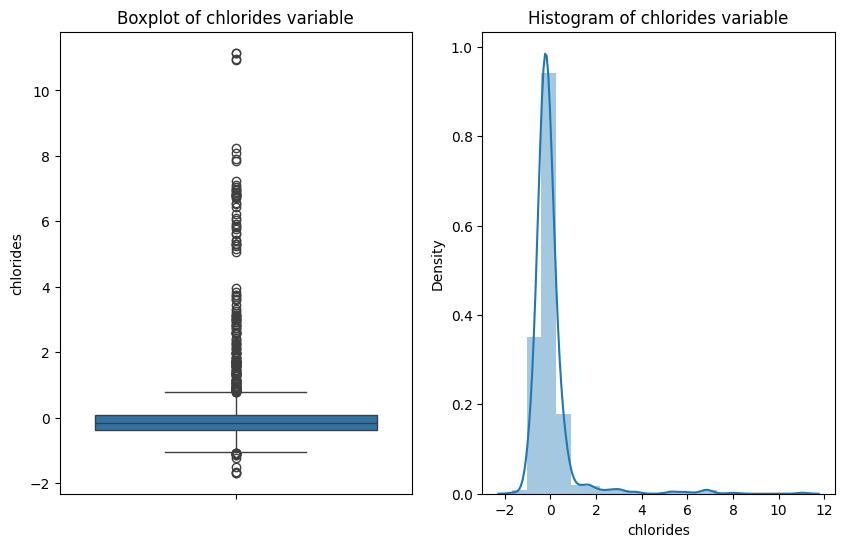

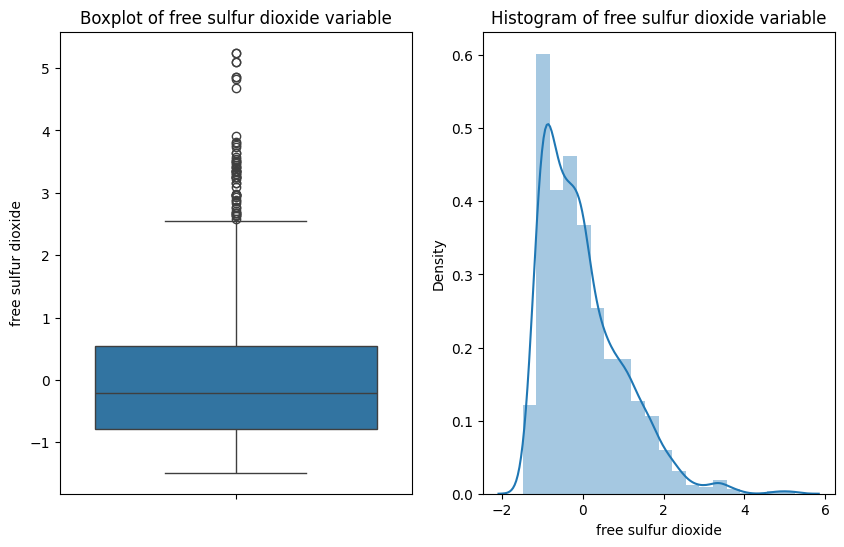

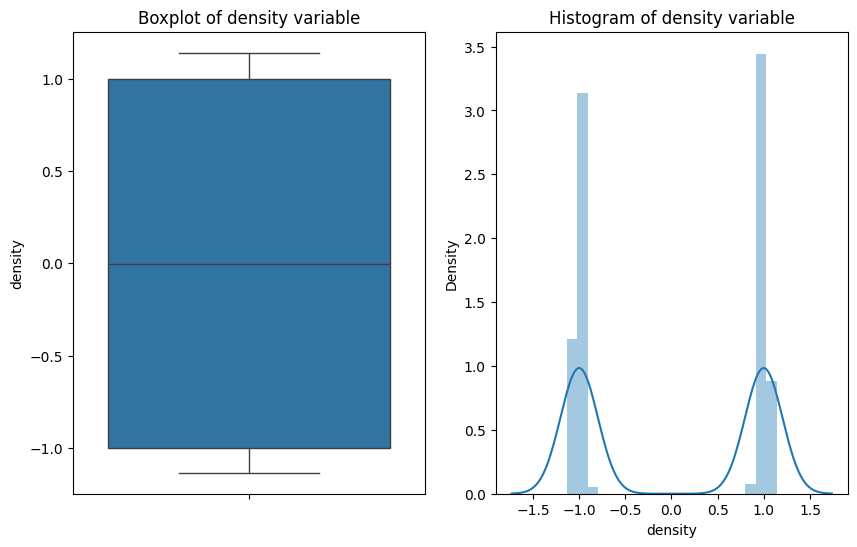

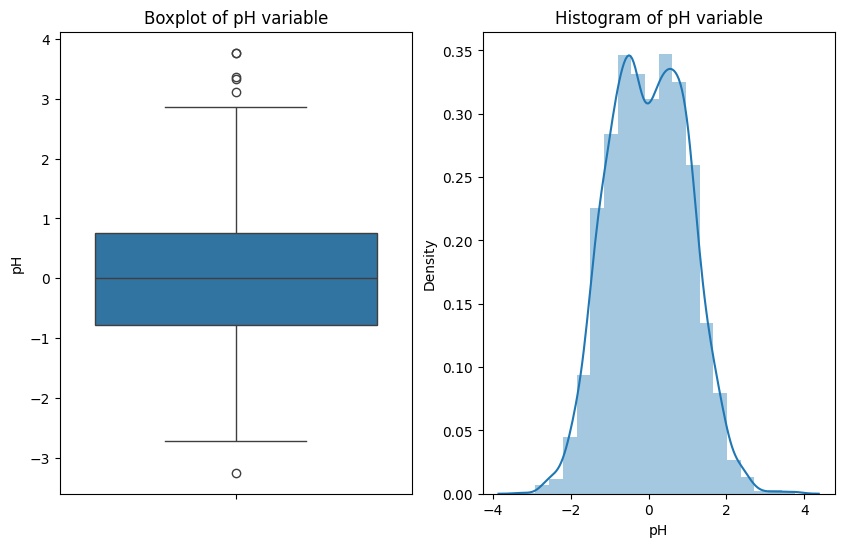

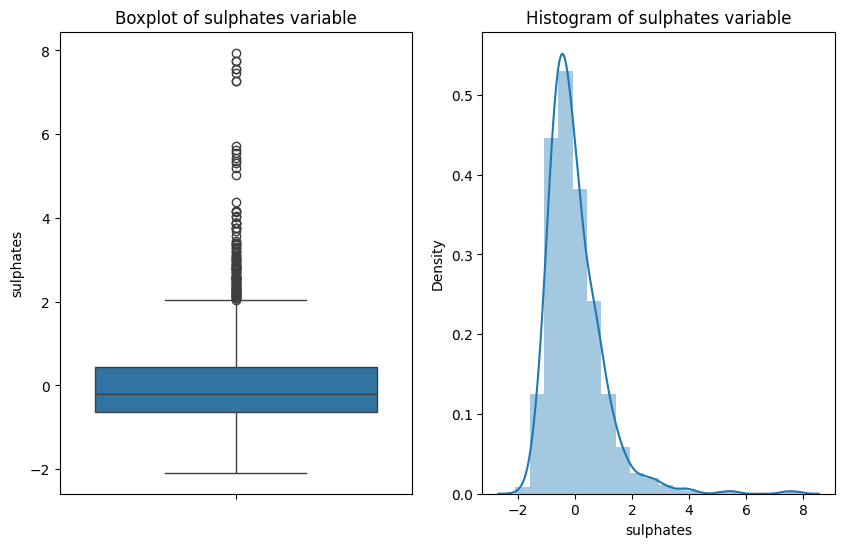

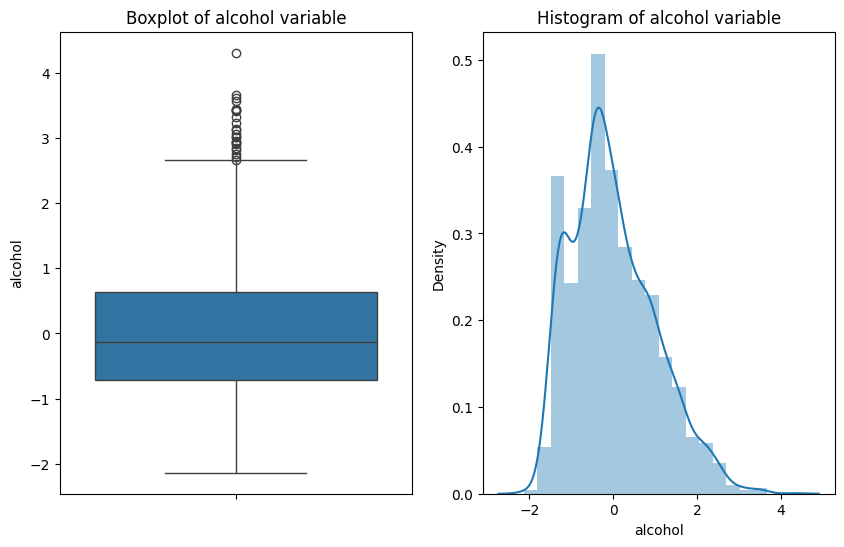

In [80]:
# Looping over all the columns except the last one ('quality') since it is categorical in nature
for col in list(df.columns[:-1]):
    plot_boxplot_and_histogram(col)

**Column: quality**

In [41]:
# 'quality' is a categorical variable
df['quality'].value_counts(normalize = True) * 100

quality
1    53.470919
0    46.529081
Name: proportion, dtype: float64

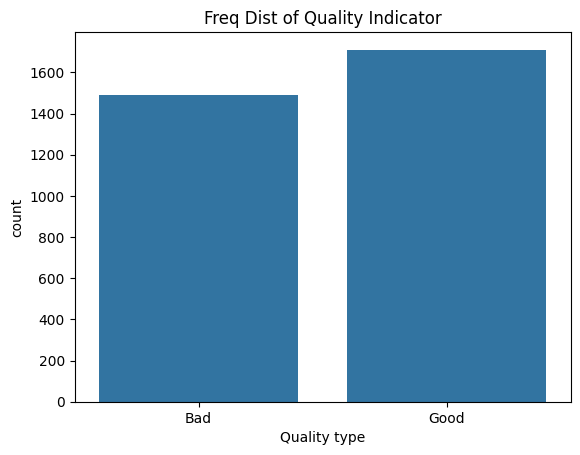

In [42]:
# Plotting the same graph using Seaborn
# To do this in Seaborn, we have the countplot
# We just have to give the dataframe and column we want to use
sns.countplot(data = df, x = df.quality)

# Similar to what we did before, we set the labels for the x-axis for the values we provided in the ticks
# We rotate them by 30 degrees
plt.xticks(ticks = [0,1], labels = ['Bad', 'Good'])

# Setting the label for the x axis
plt.xlabel('Quality type')

# Setting the label for the graph
plt.title('Freq Dist of Quality Indicator');

The quality variable is pretty balanced. 

**Plotting a Pairplot for all the numerical variables while indicating the quality label via different colours.** 

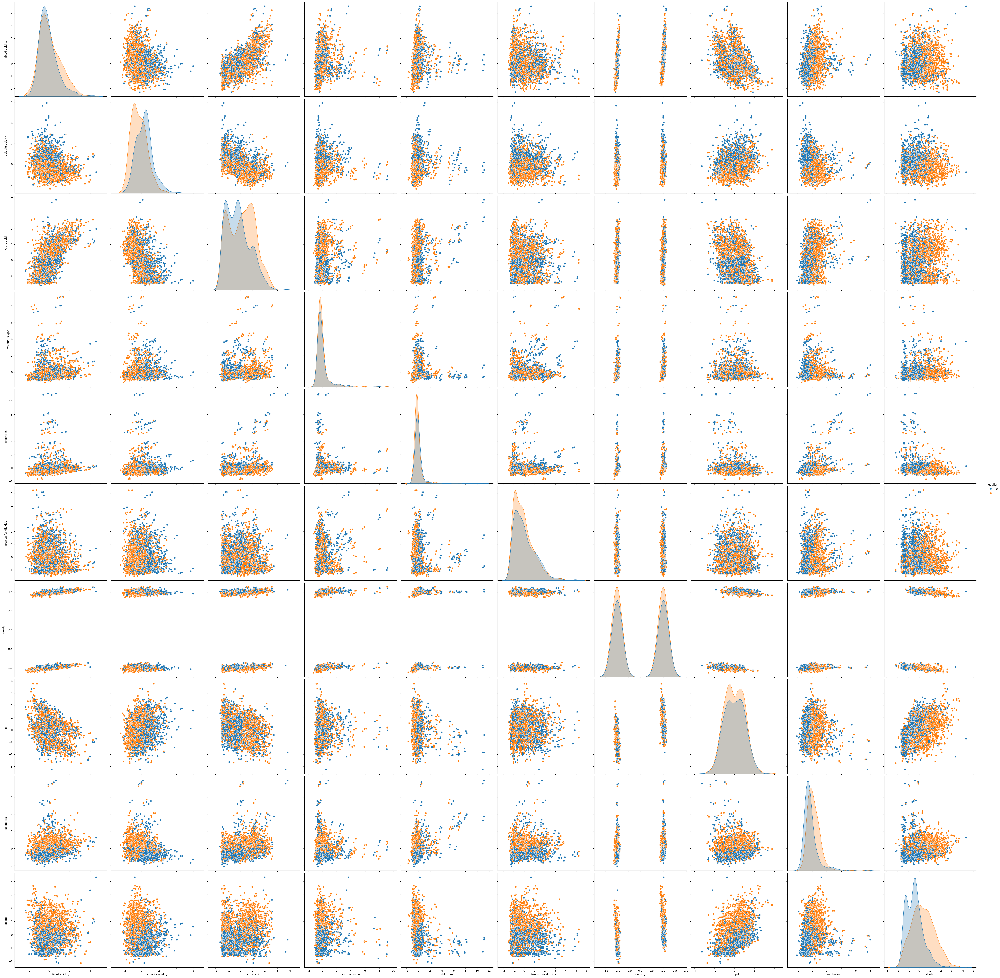

In [66]:
sns.pairplot(df, hue = 'quality', height=5)
plt.show()

-------

In [299]:
# This column will account for the feature to be multiplied by bias parameter
df.insert(0, 'x0', 1)

In [300]:
# Getting our dependent variable
y = df.pop('quality')
y.head()

0    0
1    0
2    0
3    1
4    0
Name: quality, dtype: int64

In [301]:
df.head()

,x0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,density,pH,sulphates,alcohol
0,1,-0.743787,0.805266,-1.455948,-0.541531,-0.334525,-0.539436,-0.978159,0.146723,-0.755850,-1.297136
1,1,-0.520914,1.798500,-1.455948,-0.047918,0.129345,0.787432,-0.998211,-1.220838,-0.062351,-0.960761
2,1,-0.520914,1.136344,-1.251203,-0.259467,0.002835,-0.160331,-0.994200,-0.956148,-0.235726,-0.960761
3,1,1.373509,-1.512280,1.410480,-0.541531,-0.355610,0.029222,-0.974148,-1.397297,-0.640267,-0.960761
4,1,-0.743787,0.805266,-1.455948,-0.541531,-0.334525,-0.539436,-0.978159,0.146723,-0.755850,-1.297136


### Scaling the features

In [807]:
# Loading the StandardScaler() functionality from sklearn
scaler = StandardScaler()

# Scaling our numerical variables
df_scaled = scaler.fit_transform(df)

# Splitting our dataset into train and test sets 
# Train set percentage: 80%
# Test set percentage:  20%
X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.2, random_state=42)
y_train, y_test = np.array(y_train), np.array(y_test)

In [636]:
print(df.shape, y.shape)

(3198, 11) (3198,)


In [637]:
print(X_train.shape, y_train.shape)

(2558, 11) (2558,)


In [638]:
print(X_test.shape, y_test.shape)

(640, 11) (640,)


Original Dataframe

In [307]:
df.head()

,x0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,density,pH,sulphates,alcohol
0,1,-0.743787,0.805266,-1.455948,-0.541531,-0.334525,-0.539436,-0.978159,0.146723,-0.755850,-1.297136
1,1,-0.520914,1.798500,-1.455948,-0.047918,0.129345,0.787432,-0.998211,-1.220838,-0.062351,-0.960761
2,1,-0.520914,1.136344,-1.251203,-0.259467,0.002835,-0.160331,-0.994200,-0.956148,-0.235726,-0.960761
3,1,1.373509,-1.512280,1.410480,-0.541531,-0.355610,0.029222,-0.974148,-1.397297,-0.640267,-0.960761
4,1,-0.743787,0.805266,-1.455948,-0.541531,-0.334525,-0.539436,-0.978159,0.146723,-0.755850,-1.297136


Scaled Dataframe

In [308]:
X_train.head()

,x0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,density,pH,sulphates,alcohol
3034,1,1.381144,-0.033433,0.665425,9.079524,2.836393,3.765381,1.140202,0.157765,0.792051,-0.832972
2576,1,0.327060,0.368072,0.113060,0.128967,0.508319,1.381842,1.026800,-0.093430,-0.747100,-0.703842
533,1,0.872044,-1.567460,-0.227479,-0.400499,-0.418865,-0.160331,-1.022274,-1.132608,-0.177934,1.562055
1061,1,0.203424,-0.850124,1.103363,-0.612047,-0.439950,-0.918542,-1.041925,-1.176723,-0.004560,1.309773
2626,1,-0.916592,1.688764,-1.217694,-0.273582,-0.279974,1.392175,0.943848,1.616966,-0.659386,1.489974


-------

### Weight Initialisation

- We are not using zeroes as our weights
- We are using Xavier Initialisation. As we develop the models in Task 2 and 3, it would help.

In [996]:
def initialize_weights_xavier(input_size):
    variance = 1.0 / (input_size + output_size)
    stddev = np.sqrt(variance)
    weights = np.random.normal(0, stddev, (input_size,))
    return weights

### Sigmoid Function

In [595]:
def sigmoid(z):
    return 1/(1 + np.exp(-z))

### Output Function
It computes the probabilities given a set of features and parameters

In [883]:
def output(X, thetas):
    return sigmoid(np.dot(thetas.T, X.T))

### Cost Function

Implementing the Log-Likelihood Cost Function.

In [2048]:
def cost(y, y_pred):
    return (-1/len(y)) * (y*np.log(y_pred) + (1-y)*(np.log(1- y_pred)))

### Computing the Gradients

In [799]:
gradients = (1/X_train.shape[0])*(np.dot(X_train.T, output(X_train, thetas) - y_train))
gradients.shape

(11,)

--------

**Training the Logistic Regression Model**

In [1062]:
# Defining the learning rate
learning_rate = 0.1

# Defining the number of iterations i.e. the number of epochs
num_of_iterations = 1000

# Defining two lists to account for total for both training and test sets
training_costs = []
test_costs = []

# Initialising our parameters using Xavier Initialisation
thetas = initialize_weights_xavier(X_train.shape[1])

for i in range(0, num_of_iterations):
    
    # Making predictions
    y_pred = output(X_train, thetas)
    y_pred_test = output(X_test, thetas)
    
    # Computing the Cost and appending it to a list
    training_costs.append(cost(y_train, y_pred).sum())
    test_costs.append(cost(y_test, y_pred_test).sum())
    
    # Computing the gradients
    gradients = (1/X_train.shape[0])*(np.dot(X_train.T, output(X_train, thetas) - y_train))
    
    # Updating all the parameters simultaneously
    thetas = thetas - learning_rate*gradients
    

**Plotting our training and test set costs over the epochs**

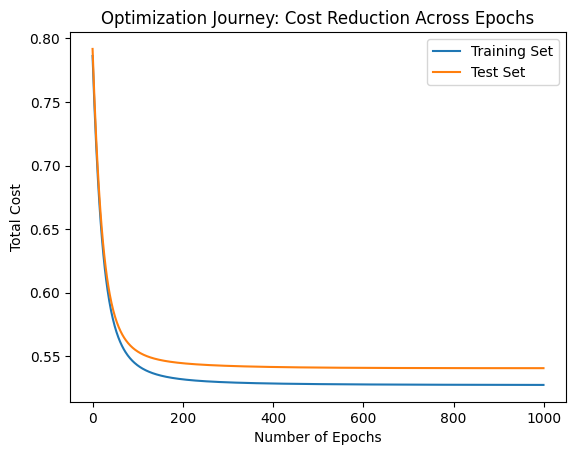

In [1063]:
# Plotting training set costs
plt.plot(training_costs, label = 'Training Set')

# Plotting test set costs
plt.plot(test_costs, label = 'Test Set')
plt.legend()

# Setting the x and y axis labels
plt.xlabel('Number of Epochs')
plt.ylabel('Total Cost')

# Setting the title
plt.title('Optimization Journey: Cost Reduction Across Epochs')

plt.show()

In [1064]:
# Learned Parameters
thetas

array([ 0.28279915,  0.28737148, -0.71670779, -0.38508273,  0.010723  ,
       -0.13081065, -0.12326845, -0.47180244, -0.00334535,  0.44425446,
        1.15896802])

In [1065]:
# Training Set Accuracy
accuracy_score(y_train, [1 if x>0.5 else 0 for x in y_pred])

0.7423768569194683

In [1066]:
# Test Set Accuracy
accuracy_score(y_test, [1 if x>0.5 else 0 for x in y_pred_test])

0.725

### Creating a Function to do all of this in one go

In [1649]:
def Logistic_Model(X_train, y_train, X_test, y_test, learning_rate = 0.1, no_of_iterations = 1000):
    '''
    This function takes in the splitted dataset along with the learning rate and no_of_iterations.
    learning_rate's default value is 0.1
    no_of_iterations's default value is 1000
    
    Input: X_train, y_train, X_test, y_test
    
    Output: thetas, training set accuracy, test set accuracy
    '''
    
    # Initialising the thetas using Xavier Initialisation
    thetas = initialize_weights_xavier(X_train.shape[1])
    
    for i in range(0, num_of_iterations):
        
        # Making predictions
        y_pred = output(X_train, thetas)
        y_pred_test = output(X_test, thetas)
        
        # Computing the gradients
        gradients = (1/X_train.shape[0])*(np.dot(X_train.T, output(X_train, thetas) - y_train))
        
        # Updating all the parameters simultaneously
        thetas = thetas - learning_rate*gradients
        
    
    return thetas, accuracy_score(y_train, [1 if x>0.5 else 0 for x in y_pred]), accuracy_score(y_test, [1 if x>0.5 else 0 for x in y_pred_test])
    
    

In [1659]:
thetas, training_accuracy, test_accuracy = Logistic_Model(X_train, y_train, X_test, y_test)

In [1660]:
print(training_accuracy, test_accuracy)

0.7415949960906959 0.725


---------

<span style="font-size: large; font-weight: bold; text-decoration: underline;">Task 2: Implementing the Dynamic Ensemble Logistic Regression Model with 2 layers</span>

<img src= '2 layers.png' alt="image" width="300" height="auto">

**Approach:**

Let's use the following notation for simplicity:

$$ l = h_{θ_L}(x) $$

$$ m = h_{θ_M}(x) $$

$$ r = h_{θ_R}(x) $$

We have the following equation:

$$ P (y | X, θ_L, θ_M, θ_R) = l^y(1-l)^{1-y}m + r^y(1-r)^{1-y}(1-m) $$

Put y = 1, we get:

$$ P (y = 1 | X, θ_L, θ_M, θ_R) = lm + r(1-m) = (l-r)m + r $$

Put y = 0, we get:

$$ P (y = 0 | X, θ_L, θ_M, θ_R) = 1 - (l-r)m - r $$

We can see that, 

$$ P (y = 1 | X, θ_L, θ_M, θ_R) = 1 - P (y = 0 | X, θ_L, θ_M, θ_R) $$

Now, we have to maximise the likelihood which is:

$$ L(θ_L, θ_M, θ_R) = \prod_{i=1}^{n} P (y_i|x_i, θ_L, θ_M, θ_R) $$

Maximising this is the same as minimising this cost f_n:

$$Cost fn = -\sum_{i=1}^n y_i \ln(p_i) + (1-y_i)\ln(1-p_i)$$

where $$p_i = l_i m_i + r_i(1-m_i) = (l_i-r_i)m_i + r_i$$



-----------

So our Cost function is essentially: $$-\sum_{i=1}^n y_i \ln((l_i-r_i)m_i + r_i) + (1-y_i)\ln(1- (l_i-r_i)m_i - r_i)$$

When we differentiate it w.r.t θ_M, we get:

$$\frac{d}{d θ_M} Cost = \sum_{i=1}^n (l-r)m'\left[\frac{y_i}{(l_i-r_i)m_i + r_i} - \frac{(1-y_i)}{1 - (l_i-r_i)m_i - r_i}\right]$$

where m' is the derivative of m w.r.t θ_M which essentially becomes:

$$\frac{m^2 X}{e^{θ_M X}}$$

---------

We have three set of thetas in this model. All are interconnected by the final probability. Maximising the Log Likelihood is the same the minimising the negative of it. Using the same approach shown above, here are the gradients for θ_M, θ_L and θ_R:


$$\frac{d}{d θ_M} Cost = \sum_{i=1}^n (l_i-r_i)m_i'\left[\frac{y_i}{(l_i-r_i)m_i + r_i} - \frac{(1-y_i)}{1 - (l_i-r_i)m_i - r_i}\right]$$

$$\frac{d}{d θ_L} Cost = \sum_{i=1}^n m_i l_i'\left[\frac{y_i}{(l_i-r_i)m_i + r_i} - \frac{(1-y_i)}{1 - (l_i-r_i)m_i - r_i}\right]$$

$$\frac{d}{d θ_R} Cost = \sum_{i=1}^n (1-m_i)r_i'\left[\frac{y_i}{(l_i-r_i)m_i + r_i} - \frac{(1-y_i)}{1 - (l_i-r_i)m_i - r_i}\right]$$

where 

$$m' = \frac{m^2 X}{e^{θ_M X}}, \ \ \ l' = \frac{l^2 X}{e^{θ_L X}}, \ \ \ r' = \frac{r^2 X}{e^{θ_R X}}$$



### <u> Implementation </u>

### Gradients for individual nodes

In [1145]:
def grad(X, thetas):
    '''This function takes in the node's parameters with the features
    and returns the gradients of the nodes with respect to its parameters
    
    Input: m 
    Output: (m^2 * X)/(e^(θ_M*X))
    
    '''
    return output(X, thetas)*output(X, thetas)/(np.exp(np.dot(thetas.T, X.T)))

### Final Probability

In [1314]:
def output2(X, m, l, r):
    '''This function returns the final probability'''
    return (l*m + r*(1-m))

### Ensemble Model (2 layers)

In [2086]:
def Ensemble_Model(X_train, y_train, X_test, y_test, learning_rate = 0.0001, no_of_iterations = 1000):
    '''
    This function takes in the splitted dataset along with the learning rate and no_of_iterations.
    learning_rate's default value is 0.0001
    no_of_iterations's default value is 1000
    
    Input: X_train, y_train, X_test, y_test
    
    Output: 
    - thetas_middle
    - thetas_left
    - thetas_right
    - training set accuracy
    - test set accuracy
    - training set costs over the epochs
    - test set costs over the epochs
    '''
    
    # Initialising the thetas using Xavier Initialisation
    thetas_middle = initialize_weights_xavier(X_train.shape[1])
    
    thetas_left   = initialize_weights_xavier(X_train.shape[1])
    thetas_right  = initialize_weights_xavier(X_train.shape[1])
    
    # Defining two lists to account for total for both training and test sets
    training_costs = []
    test_costs = []
    
    for i in range(0, no_of_iterations):
        
        # Calculating the outputs of the individual nodes
        m      = output(X_train, thetas_middle)
        m_test = output(X_test, thetas_middle)
        
        l = output(X_train, thetas_left)
        l_test = output(X_test, thetas_left)
        
        r = output(X_train, thetas_right)
        r_test = output(X_test, thetas_right)
        
        # Making predictions
        y_pred      = output2(X_train, m, l, r)
        y_pred_test = output2(X_test, m_test, l_test, r_test)
        
        # Computing the Cost and appending it to a list
        training_costs.append(cost(y_train, y_pred).sum())
        test_costs.append(cost(y_test, y_pred_test).sum())
        
        # Computing the node's gradients
        m_g = grad(X_train, thetas_middle)
        
        l_g = grad(X_train, thetas_left)
        r_g = grad(X_train, thetas_right)
        
        # Computing the final gradients
        m_gradients = (l-r) * m_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        
        l_gradients =   m   * l_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        r_gradients = (1-m) * r_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        
        
        # Updating all the parameters simultaneously
        thetas_middle = thetas_middle - learning_rate*np.dot(X_train.T, m_gradients) 
        
        thetas_left   = thetas_left   - learning_rate*np.dot(X_train.T, l_gradients)  
        thetas_right  = thetas_right  - learning_rate*np.dot(X_train.T, r_gradients) 
        
        
    
    return thetas_middle, thetas_left, thetas_right, accuracy_score(y_train, [1 if x>0.5 else 0 for x in y_pred]), accuracy_score(y_test, [1 if x>0.5 else 0 for x in y_pred_test]), training_costs, test_costs
    

In [2087]:
thetas_middle, thetas_left, thetas_right, training_accuracy, test_accuracy, training_costs, test_costs = Ensemble_Model(X_train, y_train, X_test, y_test)

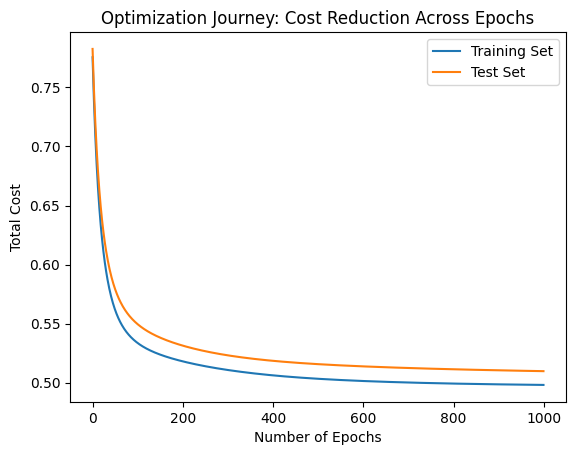

In [2088]:
# Plotting training set costs
plt.plot(training_costs, label = 'Training Set')

# Plotting test set costs
plt.plot(test_costs, label = 'Test Set')
plt.legend()

# Setting the x and y axis labels
plt.xlabel('Number of Epochs')
plt.ylabel('Total Cost')

# Setting the title
plt.title('Optimization Journey: Cost Reduction Across Epochs')

plt.show()

In [2089]:
print(training_accuracy, test_accuracy)

0.7650508209538702 0.75


----------

<span style="font-size: large; font-weight: bold; text-decoration: underline;">Task 3: Implementing the Dynamic Ensemble Logistic Regression Model with 3 layers</span>

<img src= '3 layers.png' alt="image" width="600" height="auto">

**Approach:**

Let's use the following notation for simplicity:

$$ m = h_{θ_M}(x) $$

------------------------

$$ l = h_{θ_L}(x) \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \  r = h_{θ_R}(x) $$

------------------------

$$ a = h_{θ_A}(x) \ \ \ \ \ \ \ \ \ \ b = h_{θ_B}(x) \ \ \ \ \ \ \ \ \ \ c = h_{θ_C}(x)  \ \ \ \ \ \ \ \ \ \  d = h_{θ_D}(x)$$


We have the following equation:

$$ P (y = 1 | X, θ_M, θ_L, θ_R, θ_A, θ_B, θ_C, θ_D) = mla + m(1-l)b + (1-m)rc + (1-m)(1-r)d $$

Now, we have to maximise the likelihood which is:

$$ L(θ_M, θ_L, θ_R, θ_A, θ_B, θ_C, θ_D) = \prod_{i=1}^{n} P (y_i|x_i, θ_M, θ_L, θ_R, θ_A, θ_B, θ_C, θ_D) $$

Maximising this is the same as minimising this cost f_n:

$$Cost fn = -\sum_{i=1}^n y_i \ln(p_i) + (1-y_i)\ln(1-p_i)$$

where $$ p_i = m_i l_i a_i + m_i(1-l_i)b_i+ (1-m_i)r_ic_i + (1-m_i)(1-r_i)d_i $$




-----------

We know the derivatives of the individual nodes' outputs with respect to their parameters:


$$m' = \frac{m^2 X}{e^{θ_M X}}, \ \ \ l' = \frac{l^2 X}{e^{θ_L X}}, \ \ \ r' = \frac{r^2 X}{e^{θ_R X}}, \ \ \ a' = \frac{a^2 X}{e^{θ_A X}}, \ \ \ b' = \frac{b^2 X}{e^{θ_B X}}, \ \ \ c' = \frac{c^2 X}{e^{θ_C X}}, \ \ \ d' = \frac{d^2 X}{e^{θ_D X}}$$


We have 7 set of thetas in this model. All are interconnected by the final probability. Maximising the Log Likelihood is the same the minimising the negative of it. Using the same approach shown above, here are the gradients for θ_M, θ_L, θ_R, θ_A, θ_B, θ_C, θ_D:


$$\frac{d}{d θ_M} Cost = -\sum_{i=1}^n (l_i a_i + (1-l_i)b_i - r_i c_i - (1-r_i)d_i)m_i'\left[\frac{y_i}{p_i} - \frac{(1-y_i)}{1 - p_i}\right]$$

$$\frac{d}{d θ_L} Cost = -\sum_{i=1}^n m_i(a_i-b_i)l_i' \left[\frac{y_i}{p_i} - \frac{(1-y_i)}{1 - p_i}\right]$$

$$\frac{d}{d θ_R} Cost = -\sum_{i=1}^n (1-m_i)(c_i-d_i)r_i'\left[\frac{y_i}{p_i} - \frac{(1-y_i)}{1 - p_i}\right]$$

$$\frac{d}{d θ_A} Cost = -\sum_{i=1}^n m_i l_i a_i'\left[\frac{y_i}{p_i} - \frac{(1-y_i)}{1 - p_i}\right]$$

$$\frac{d}{d θ_B} Cost = -\sum_{i=1}^n m_i (1-l_i)b_i'\left[\frac{y_i}{p_i} - \frac{(1-y_i)}{1 - p_i}\right]$$

$$\frac{d}{d θ_C} Cost = -\sum_{i=1}^n (1-m_i)r_i c_i'\left[\frac{y_i}{p_i} - \frac{(1-y_i)}{1 - p_i}\right]$$

$$\frac{d}{d θ_D} Cost = -\sum_{i=1}^n (1-m_i)(1-r_i)d_i'\left[\frac{y_i}{p_i} - \frac{(1-y_i)}{1 - p_i}\right]$$


where 

$$ p_i = m_i l_i a_i + m_i(1-l_i)b_i+ (1-m_i)r_ic_i + (1-m_i)(1-r_i)d_i $$








### <u>Implementation</u>

### Final Probability

In [1883]:
def output3(m, l, r, a, b, c, d):
    '''This function calculates the final probability'''
    return a*l*m + b*(1-l)*m + c*r*(1-m) + d*(1-r)*(1-m)

### Ensemble Model (3 layers)

In [2078]:
def Three_Layer_Ensemble_Model(X_train, y_train, X_test, y_test, learning_rate = 0.001, no_of_iterations = 1000):
    '''
    This function takes in the splitted dataset along with the learning rate and no_of_iterations.
    learning_rate's default value is 0.001
    no_of_iterations's default value is 1000
    
    Input: X_train, y_train, X_test, y_test
    
    Output: 
    - thetas_middle
    - thetas_left
    - thetas_right
    - thetas_a
    - thetas_b
    - thetas_c
    - thetas_d
    - training set accuracy
    - test set accuracy
    - training set costs over the epochs
    - test set costs over the epochs
    '''
    
    # Initialising the thetas using Xavier Initialisation
    thetas_middle = initialize_weights_xavier(X_train.shape[1])
    
    thetas_left   = initialize_weights_xavier(X_train.shape[1])
    thetas_right  = initialize_weights_xavier(X_train.shape[1])
    
    thetas_a      = initialize_weights_xavier(X_train.shape[1])
    thetas_b      = initialize_weights_xavier(X_train.shape[1])
    thetas_c      = initialize_weights_xavier(X_train.shape[1])
    thetas_d      = initialize_weights_xavier(X_train.shape[1])

    # Defining two lists to account for total for both training and test sets
    training_costs = []
    test_costs     = []
    
    for i in range(0, no_of_iterations):
        
        # Calculating the outputs of the individual nodes
        m      = output(X_train, thetas_middle)
        m_test = output(X_test, thetas_middle)
        
        l      = output(X_train, thetas_left)
        l_test = output(X_test, thetas_left)
        
        r      = output(X_train, thetas_right)
        r_test = output(X_test, thetas_right)
        
        a      = output(X_train, thetas_a)
        a_test = output(X_test, thetas_a)
        
        b      = output(X_train, thetas_b)
        b_test = output(X_test, thetas_b)
        
        c      = output(X_train, thetas_c)
        c_test = output(X_test, thetas_c)
        
        d      = output(X_train, thetas_d)
        d_test = output(X_test, thetas_d)
        
        # Making predictions
        y_pred      = output3(m, l, r, a, b, c, d)
        y_pred_test = output3(m_test, l_test, r_test, a_test, b_test, c_test, d_test)
        
        # Computing the Cost and appending it to a list
        training_costs.append(cost(y_train, y_pred).sum())
        test_costs.append(cost(y_test, y_pred_test).sum())
        
        # Computing the node's gradients
        m_g = grad(X_train, thetas_middle)
        
        l_g = grad(X_train, thetas_left)
        r_g = grad(X_train, thetas_right)
        
        a_g = grad(X_train, thetas_a)
        b_g = grad(X_train, thetas_b)
        c_g = grad(X_train, thetas_c)
        d_g = grad(X_train, thetas_d)
        
        # Computing the final gradients
        m_gradients =  -(l*a + (1-l)*b - r*c - (1-r)*d) * m_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        
        l_gradients =   - m * (a-b)                     * l_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        r_gradients =  -(1-m) * (c-d)                   * r_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        
        a_gradients =  -(m*l)                           * a_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        b_gradients =   - m * (1-l)                     * b_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        c_gradients =  -(1-m) * r                       * c_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        d_gradients =  -(1-m) * (1-r)                   * d_g * ( (y_train/y_pred) - ((1-y_train)/(1-y_pred)) ) 
        
        # Updating all the parameters simultaneously
        thetas_middle = thetas_middle - learning_rate*np.dot(X_train.T, m_gradients) 
        
        thetas_left   = thetas_left   - learning_rate*np.dot(X_train.T, l_gradients)  
        thetas_right  = thetas_right  - learning_rate*np.dot(X_train.T, r_gradients) 
        
        thetas_a = thetas_a - learning_rate*np.dot(X_train.T, a_gradients) 
        thetas_b = thetas_b - learning_rate*np.dot(X_train.T, b_gradients) 
        thetas_c = thetas_c - learning_rate*np.dot(X_train.T, c_gradients) 
        thetas_d = thetas_d - learning_rate*np.dot(X_train.T, d_gradients) 
        
    
    return thetas_middle, thetas_left, thetas_right, thetas_a, thetas_b, thetas_c, thetas_d, accuracy_score(y_train, [1 if x>0.5 else 0 for x in y_pred]), accuracy_score(y_test, [1 if x>0.5 else 0 for x in y_pred_test]), training_costs, test_costs
    

In [2079]:
thetas_middle, thetas_left, thetas_right, thetas_a, thetas_b, thetas_c, thetas_d, training_accuracy, test_accuracy, training_costs, test_costs= Three_Layer_Ensemble_Model(X_train, y_train, X_test, y_test)
training_accuracy, test_accuracy

(0.7849882720875684, 0.7703125)

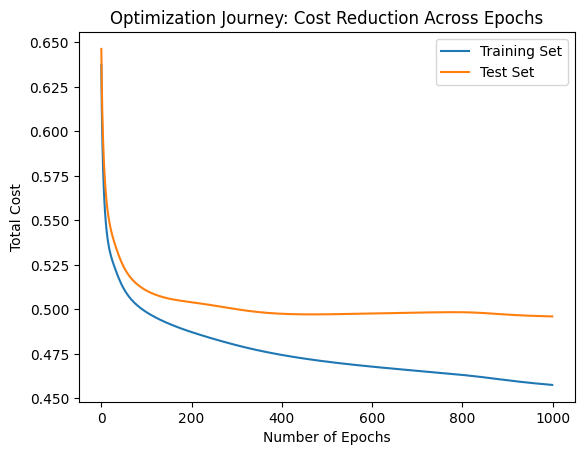

In [2080]:
# Plotting training set costs
plt.plot(training_costs, label = 'Training Set')

# Plotting test set costs
plt.plot(test_costs, label = 'Test Set')
plt.legend()

# Setting the x and y axis labels
plt.xlabel('Number of Epochs')
plt.ylabel('Total Cost')

# Setting the title
plt.title('Optimization Journey: Cost Reduction Across Epochs')

plt.show()

-----------

Here's the summary of the accuracies we obtained:


|              Models               | Training Set Accuracy | Test Set Accuracy |
| --------------------------------- | --------------------- | ----------------- |
| Logistic Regression Model         |  74.15%               | 72.5%             |
| Dynamic Ensemble Model (2 layers) |  76.5%                | 75%               |
| Dynamic Ensemble Model (3 layers) |  78.49%               | 77.03%            |    


--------

**Citation:**

SSaishruthi. (n.d.). SSaishruthi/logisticregression_vectorized_implementation. GitHub. https://github.com/SSaishruthi/LogisticRegression_Vectorized_Implementation 

-----